In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
plt.style.use('seaborn-colorblind')
sns.set_style('darkgrid')

In [3]:
# Read coverage per base file and add column names to the file
header = ["chr", "start", "end", "feature", "base", "31278", "31282", "31290", 
          "31292", "31299", "31305", "31307", "31316", "31318", "31279", "31284", 
          "31291", "31298", "31300", "31306", "31315", "31317"]
df = pd.read_csv("/home/ugdg/workspace/coverage_HGUV/pasted_pbcov.tsv", sep="\t")
df.head()

,chr,start,end,feature,base,31278,31282,31290,31292,31299,...,31316,31318,31279,31284,31291,31298,31300,31306,31315,31317
0,1,63063147,63063742,ANGPTL3-1,1,33,25,30,24,25,...,26,18,25,30,39,34,30,41,27,32
1,1,63063147,63063742,ANGPTL3-1,2,35,25,31,24,25,...,27,19,25,30,42,35,31,41,28,33
2,1,63063147,63063742,ANGPTL3-1,3,35,25,31,24,25,...,27,19,25,30,42,35,31,41,28,33
3,1,63063147,63063742,ANGPTL3-1,4,35,24,31,24,25,...,27,19,25,30,41,35,31,40,28,33
4,1,63063147,63063742,ANGPTL3-1,5,35,24,31,24,25,...,27,19,25,30,41,35,31,40,28,33


In [5]:
df["mean"] = df.loc[:, ["31278", "31282", "31290", "31292", "31299", "31305", 
                        "31307", "31316", "31318", "31279", "31284", "31291", 
                        "31298", "31300", "31306", "31315", "31317"]].mean(axis=1)

gene_list = []
for gene in list(df["feature"]):
    gene_list.append(gene.split("-")[0])
    
df["gene"] = gene_list
df.head()

,chr,start,end,feature,base,31278,31282,31290,31292,31299,...,31279,31284,31291,31298,31300,31306,31315,31317,mean,gene
0,1,63063147,63063742,ANGPTL3-1,1,33,25,30,24,25,...,25,30,39,34,30,41,27,32,29.823529,ANGPTL3
1,1,63063147,63063742,ANGPTL3-1,2,35,25,31,24,25,...,25,30,42,35,31,41,28,33,30.529412,ANGPTL3
2,1,63063147,63063742,ANGPTL3-1,3,35,25,31,24,25,...,25,30,42,35,31,41,28,33,30.529412,ANGPTL3
3,1,63063147,63063742,ANGPTL3-1,4,35,24,31,24,25,...,25,30,41,35,31,40,28,33,30.352941,ANGPTL3
4,1,63063147,63063742,ANGPTL3-1,5,35,24,31,24,25,...,25,30,41,35,31,40,28,33,30.352941,ANGPTL3


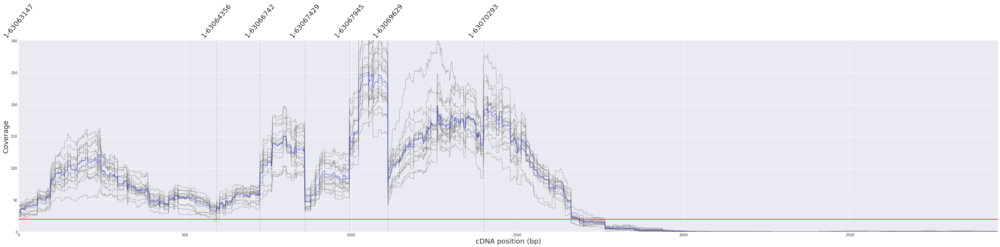

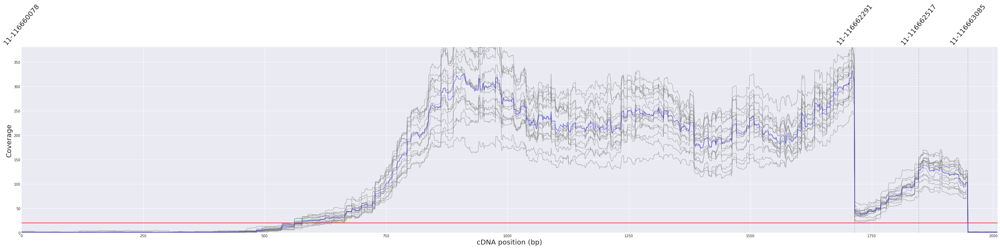

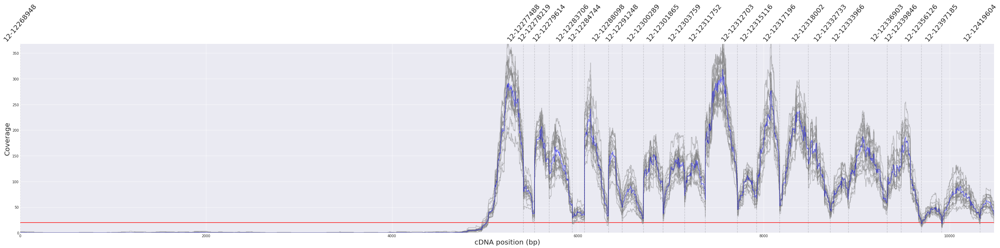

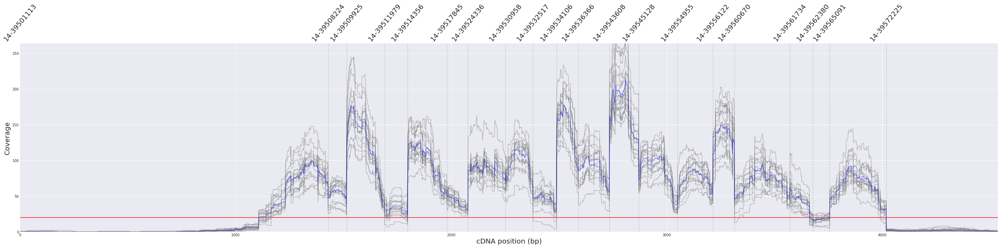

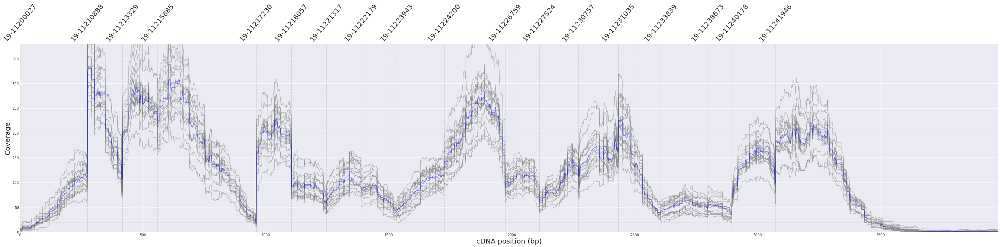

...

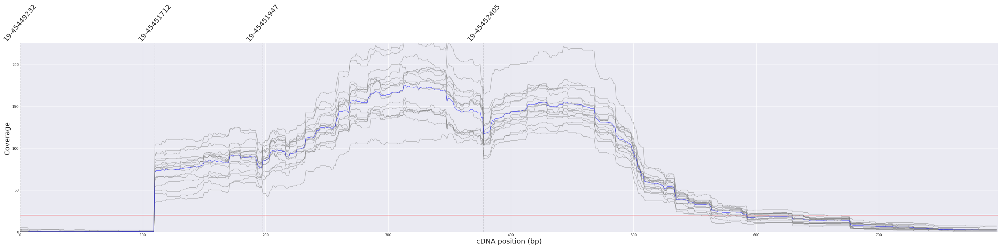

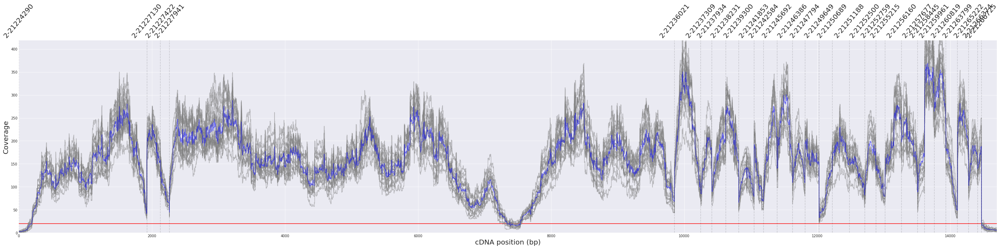

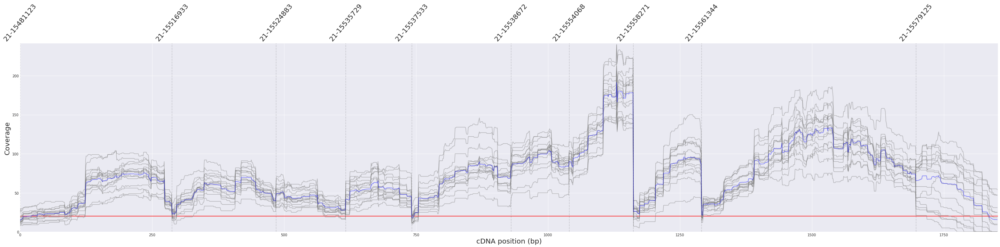

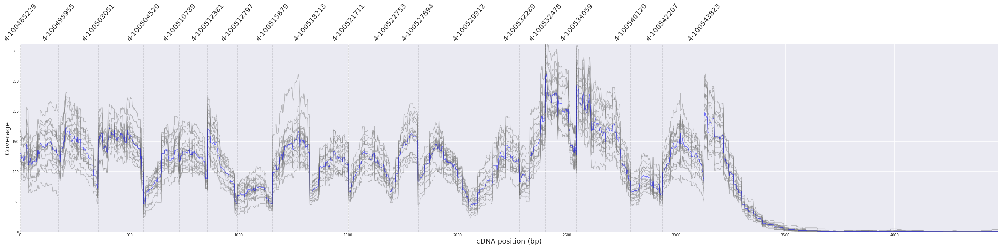

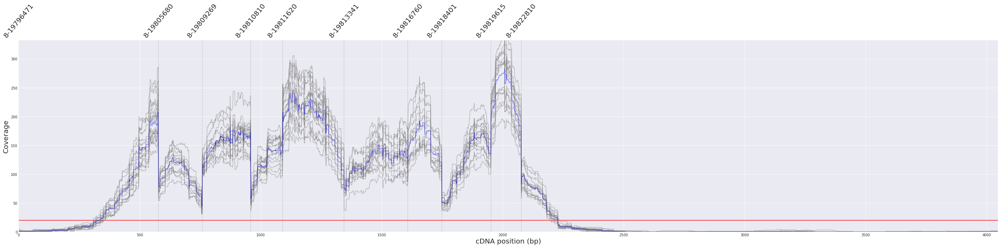

In [17]:
# Create a copy of the dataframe so I dont make changes to the original dataframe
ab = df.copy()

# Create a dataframe per gene
for gene in list(ab.gene.unique()):
    dfg = ab.loc[ab['gene'].map(str) == gene].reset_index(drop=True)
    dfg["index"] = dfg.index

    # Create a plot per gene
    fig = plt.figure(figsize=(40,10))
    ax1 = fig.add_subplot(111)
    for i in range(5, len(header)):
        ax1.plot(dfg['index'], dfg[header[i]], alpha=0.5, color='gray')
    ax1.plot(dfg['index'], dfg['mean'], alpha=0.5, color='blue')
    # Plot limits
    ax1.set_ylim(0, dfg['mean'].max() + 50)
    ax1.set_xlim(0, dfg['index'].max() + 1)
    ax1.hlines(y=20, xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[-1], color='r')

    # Getting positions to plot vertical lines separating exons
    index_positions = []
    names = []
    for exon in list(dfg.feature.unique()):
        index_positions.append(dfg[dfg['feature']==exon].iloc[0]["index"])
        names.append(str(dfg[dfg['feature']==exon].iloc[0]["chr"]) + "-" + 
                     str(dfg[dfg['feature']==exon].iloc[0]["start"]))

    # Set limits for the vertical lines, it is a plot on top of a plot
    ax2 = ax1.twiny()
    ax2.set_ylim(ax1.get_ylim())
    ax2.set_xlim(ax1.get_xlim())

    # Paint vertical lines, we use [1:] because the first point is always zero
    ax2.vlines(x=index_positions, ymin=0, ymax=ax2.get_ylim()[1], linestyle='--', 
               alpha=0.15)
    ax2.grid(b=False)
    ax2.set_xticks(index_positions)
    ax2.set_xticklabels(names, rotation=50, minor=False, fontsize=20)

    ax1.set_xlabel('cDNA position (bp)', fontsize=20)
    ax1.set_ylabel('Coverage', fontsize=20)

    fig.tight_layout()
    figname = "{}_pbcov.png".format(gene)
    fig.savefig(os.path.join("/home/ugdg/workspace/coverage_HGUV/", figname))
    plt.show()
    plt.close(fig)

## Testing Miguel's idea

In [151]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
plt.style.use('seaborn-colorblind')
sns.set_style('darkgrid')

In [152]:
# Read coverage per base file and add column names to the file
header = ["chr", "start", "end", "feature", "base", "31278", "31282", "31290", 
          "31292", "31299", "31305", "31307", "31316", "31318", "31279", "31284", 
          "31291", "31298", "31300", "31306", "31315", "31317"]
df = pd.read_csv("/home/ugdg/workspace/coverage_HGUV/pasted_pbcov.tsv", sep="\t")
df.head()

,chr,start,end,feature,base,31278,31282,31290,31292,31299,...,31316,31318,31279,31284,31291,31298,31300,31306,31315,31317
0,1,63063147,63063742,ANGPTL3-1,1,33,25,30,24,25,...,26,18,25,30,39,34,30,41,27,32
1,1,63063147,63063742,ANGPTL3-1,2,35,25,31,24,25,...,27,19,25,30,42,35,31,41,28,33
2,1,63063147,63063742,ANGPTL3-1,3,35,25,31,24,25,...,27,19,25,30,42,35,31,41,28,33
3,1,63063147,63063742,ANGPTL3-1,4,35,24,31,24,25,...,27,19,25,30,41,35,31,40,28,33
4,1,63063147,63063742,ANGPTL3-1,5,35,24,31,24,25,...,27,19,25,30,41,35,31,40,28,33


In [153]:
#df["mean"] = df.loc[:, ["31278", "31282", "31290", "31292", "31299", "31305", 
                        #"31307", "31316", "31318", "31279", "31284", "31291", 
                        #"31298", "31300", "31306", "31315", "31317"]].mean(axis=1)

gene_list = []
for gene in list(df["feature"]):
    gene_list.append(gene.split("-")[0])
    
df["gene"] = gene_list
df.head()

,chr,start,end,feature,base,31278,31282,31290,31292,31299,...,31318,31279,31284,31291,31298,31300,31306,31315,31317,gene
0,1,63063147,63063742,ANGPTL3-1,1,33,25,30,24,25,...,18,25,30,39,34,30,41,27,32,ANGPTL3
1,1,63063147,63063742,ANGPTL3-1,2,35,25,31,24,25,...,19,25,30,42,35,31,41,28,33,ANGPTL3
2,1,63063147,63063742,ANGPTL3-1,3,35,25,31,24,25,...,19,25,30,42,35,31,41,28,33,ANGPTL3
3,1,63063147,63063742,ANGPTL3-1,4,35,24,31,24,25,...,19,25,30,41,35,31,40,28,33,ANGPTL3
4,1,63063147,63063742,ANGPTL3-1,5,35,24,31,24,25,...,19,25,30,41,35,31,40,28,33,ANGPTL3


In [154]:
ab = df.copy()

In [155]:
list_samples = ["31278", "31282", "31290", 
          "31292", "31299", "31305", "31307", "31316", "31318", "31279", "31284", 
          "31291", "31298", "31300", "31306", "31315", "31317"]

In [156]:

for elem in list_samples:
    ab[elem] = ab[elem]/ab[elem].median()

ab["mean"] = ab.loc[:, list_samples].median(axis=1)
ab["mean"] = ab["mean"]/ab["mean"].median()
list_samples = list_samples + ["mean"]

ab.head()

,chr,start,end,feature,base,31278,31282,31290,31292,31299,...,31279,31284,31291,31298,31300,31306,31315,31317,gene,mean
0,1,63063147,63063742,ANGPTL3-1,1,0.300000,0.271739,0.344828,0.269663,0.260417,...,0.284091,0.277778,0.433333,0.395349,0.260870,0.436170,0.241071,0.313725,ANGPTL3,0.281485
1,1,63063147,63063742,ANGPTL3-1,2,0.318182,0.271739,0.356322,0.269663,0.260417,...,0.284091,0.277778,0.466667,0.406977,0.269565,0.436170,0.250000,0.323529,ANGPTL3,0.281603
2,1,63063147,63063742,ANGPTL3-1,3,0.318182,0.271739,0.356322,0.269663,0.260417,...,0.284091,0.277778,0.466667,0.406977,0.269565,0.436170,0.250000,0.323529,ANGPTL3,0.281603
3,1,63063147,63063742,ANGPTL3-1,4,0.318182,0.260870,0.356322,0.269663,0.260417,...,0.284091,0.277778,0.455556,0.406977,0.269565,0.425532,0.250000,0.323529,ANGPTL3,0.281603
4,1,63063147,63063742,ANGPTL3-1,5,0.318182,0.260870,0.356322,0.269663,0.260417,...,0.284091,0.277778,0.455556,0.406977,0.269565,0.425532,0.250000,0.323529,ANGPTL3,0.281603


In [157]:
from scipy.stats import zscore

In [158]:
c = ab[list_samples].apply(zscore)
for el in list_samples:
    ab[el] = c[el]

ab.head()

,chr,start,end,feature,base,31278,31282,31290,31292,31299,...,31279,31284,31291,31298,31300,31306,31315,31317,gene,mean
0,1,63063147,63063742,ANGPTL3-1,1,-0.855363,-0.892649,-0.828557,-0.881297,-0.88546,...,-0.860118,-0.887371,-0.702358,-0.759605,-0.911188,-0.710186,-0.929438,-0.846035,ANGPTL3,-0.887820
1,1,63063147,63063742,ANGPTL3-1,2,-0.833703,-0.892649,-0.815622,-0.881297,-0.88546,...,-0.860118,-0.887371,-0.662316,-0.746389,-0.900899,-0.710186,-0.919046,-0.835320,ANGPTL3,-0.887682
2,1,63063147,63063742,ANGPTL3-1,3,-0.833703,-0.892649,-0.815622,-0.881297,-0.88546,...,-0.860118,-0.887371,-0.662316,-0.746389,-0.900899,-0.710186,-0.919046,-0.835320,ANGPTL3,-0.887682
3,1,63063147,63063742,ANGPTL3-1,4,-0.833703,-0.905285,-0.815622,-0.881297,-0.88546,...,-0.860118,-0.887371,-0.675663,-0.746389,-0.900899,-0.722173,-0.919046,-0.835320,ANGPTL3,-0.887682
4,1,63063147,63063742,ANGPTL3-1,5,-0.833703,-0.905285,-0.815622,-0.881297,-0.88546,...,-0.860118,-0.887371,-0.675663,-0.746389,-0.900899,-0.722173,-0.919046,-0.835320,ANGPTL3,-0.887682


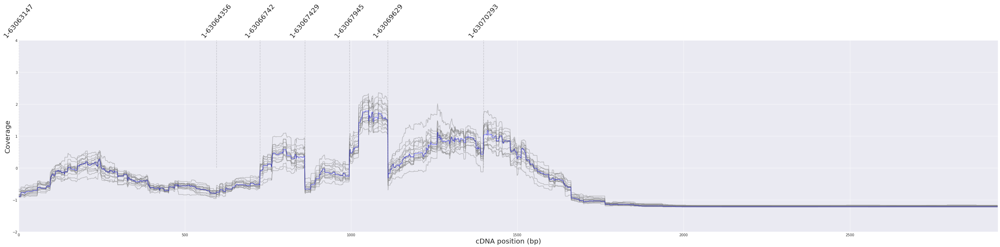

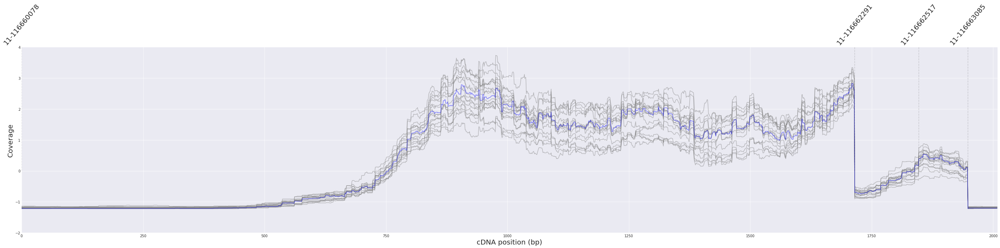

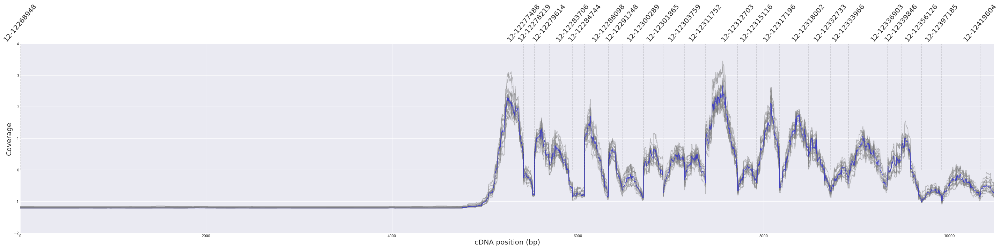

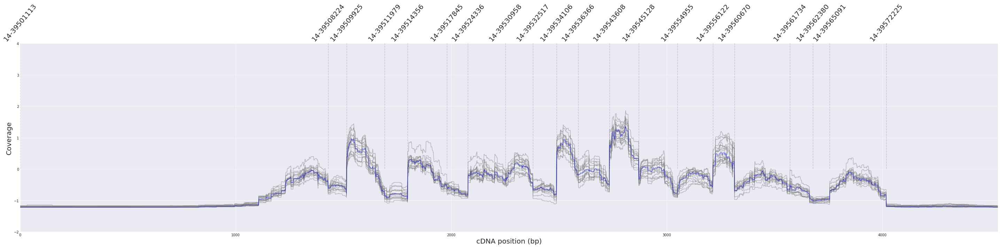

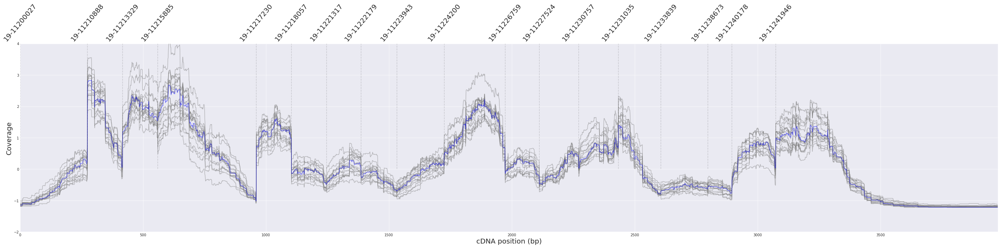

...

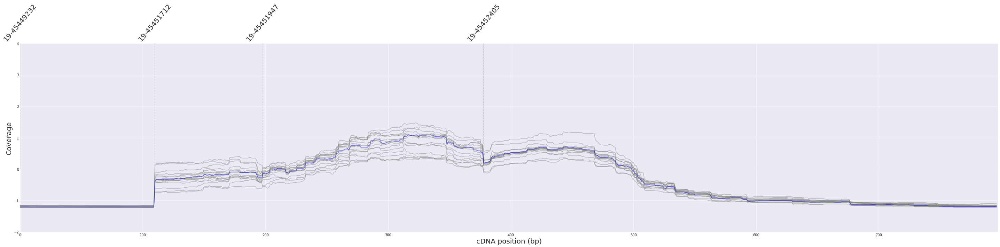

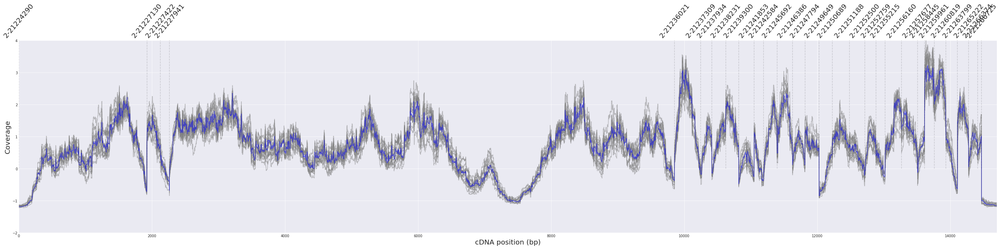

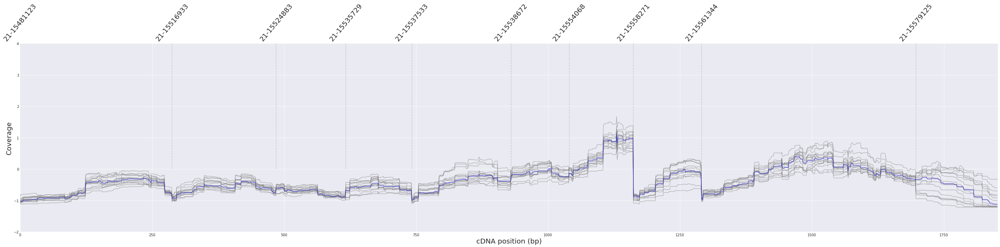

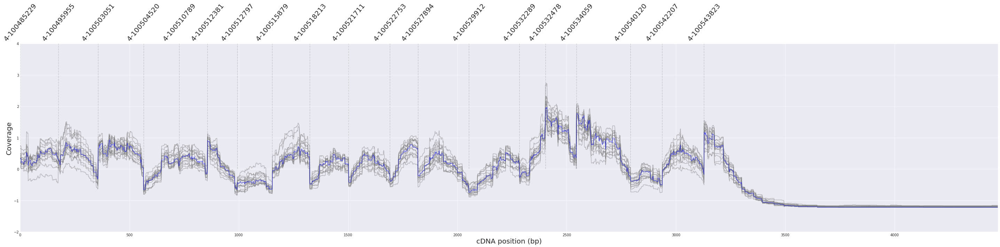

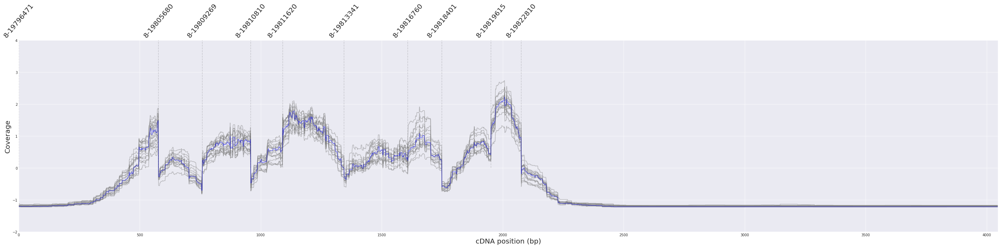

In [159]:
# Create a dataframe per gene
for gene in list(ab.gene.unique()):
    dfg = ab.loc[ab['gene'].map(str) == gene].reset_index(drop=True)
    dfg["index"] = dfg.index

    # Create a plot per gene
    fig = plt.figure(figsize=(40,10))
    ax1 = fig.add_subplot(111)
    for i in range(5, len(header)):
        ax1.plot(dfg['index'], dfg[header[i]], alpha=0.5, color='gray')
    ax1.plot(dfg['index'], dfg['mean'], alpha=0.5, color='blue')
    # Plot limits
    ax1.set_ylim(-2, 4)
    ax1.set_xlim(0, dfg['index'].max() + 1)
    #ax1.hlines(y=20, xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[-1], color='r')

    # Getting positions to plot vertical lines separating exons
    index_positions = []
    names = []
    for exon in list(dfg.feature.unique()):
        index_positions.append(dfg[dfg['feature']==exon].iloc[0]["index"])
        names.append(str(dfg[dfg['feature']==exon].iloc[0]["chr"]) + "-" + 
                     str(dfg[dfg['feature']==exon].iloc[0]["start"]))

    # Set limits for the vertical lines, it is a plot on top of a plot
    ax2 = ax1.twiny()
    ax2.set_ylim(ax1.get_ylim())
    ax2.set_xlim(ax1.get_xlim())

    # Paint vertical lines, we use [1:] because the first point is always zero
    ax2.vlines(x=index_positions, ymin=0, ymax=ax2.get_ylim()[1], linestyle='--', 
               alpha=0.15)
    ax2.grid(b=False)
    ax2.set_xticks(index_positions)
    ax2.set_xticklabels(names, rotation=50, minor=False, fontsize=20)

    ax1.set_xlabel('cDNA position (bp)', fontsize=20)
    ax1.set_ylabel('Coverage', fontsize=20)

    fig.tight_layout()
    figname = "{}_pbcov.png".format(gene)
    fig.savefig(os.path.join("/home/ugdg/workspace/coverage_HGUV/", figname))
    plt.show()
    plt.close(fig)

## New test

In [160]:
cd = ab.copy()

In [161]:
for e in list_samples:
    cd[e] = cd[e] - cd["mean"]

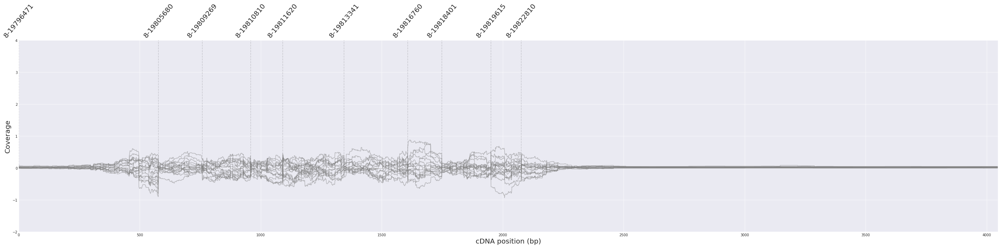

In [162]:
# Create a dataframe per gene

dfg = cd.loc[cd['gene'].map(str) == "LPL"].reset_index(drop=True)
dfg["index"] = dfg.index

    # Create a plot per gene
fig = plt.figure(figsize=(40,10))
ax1 = fig.add_subplot(111)
for i in range(5, len(header)):
    ax1.plot(dfg['index'], dfg[header[i]], alpha=0.5, color='gray')
#ax1.plot(dfg['index'], dfg['mean'], alpha=0.5, color='blue')
    # Plot limits
ax1.set_ylim(-2, 4)
ax1.set_xlim(0, dfg['index'].max() + 1)
    #ax1.hlines(y=20, xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[-1], color='r')

    # Getting positions to plot vertical lines separating exons
index_positions = []
names = []
for exon in list(dfg.feature.unique()):
    index_positions.append(dfg[dfg['feature']==exon].iloc[0]["index"])
    names.append(str(dfg[dfg['feature']==exon].iloc[0]["chr"]) + "-" + 
                    str(dfg[dfg['feature']==exon].iloc[0]["start"]))

    # Set limits for the vertical lines, it is a plot on top of a plot
ax2 = ax1.twiny()
ax2.set_ylim(ax1.get_ylim())
ax2.set_xlim(ax1.get_xlim())

    # Paint vertical lines, we use [1:] because the first point is always zero
ax2.vlines(x=index_positions, ymin=0, ymax=ax2.get_ylim()[1], linestyle='--', 
            alpha=0.15)
ax2.grid(b=False)
ax2.set_xticks(index_positions)
ax2.set_xticklabels(names, rotation=50, minor=False, fontsize=20)

ax1.set_xlabel('cDNA position (bp)', fontsize=20)
ax1.set_ylabel('Coverage', fontsize=20)

fig.tight_layout()
    #figname = "{}_pbcov.png".format(gene)
    #fig.savefig(os.path.join("/home/ugdg/workspace/coverage_HGUV/", figname))
plt.show()
    #plt.close(fig)

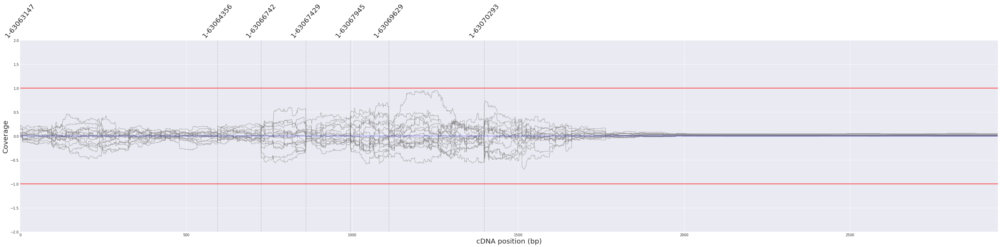

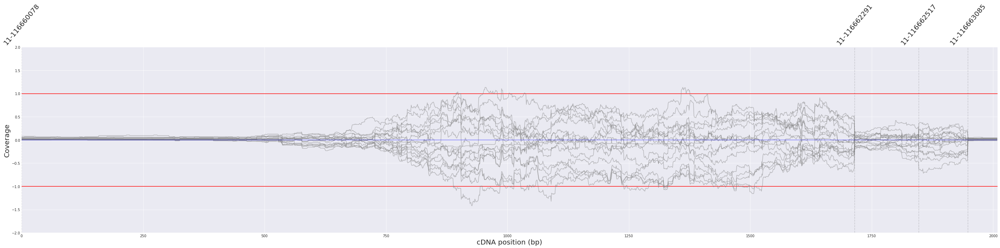

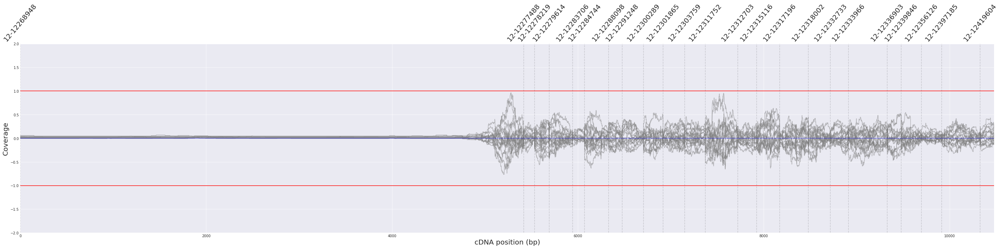

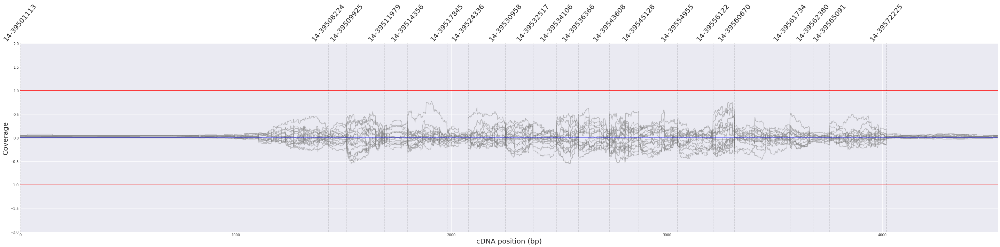

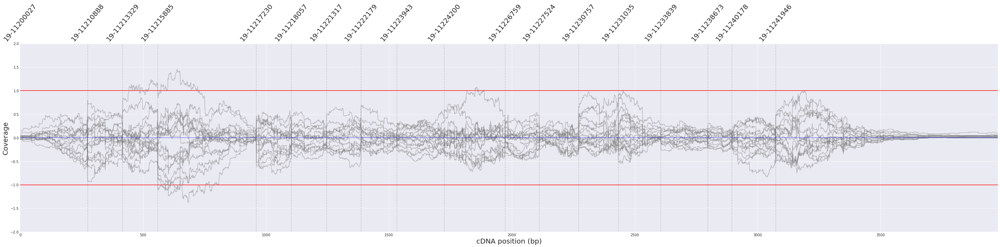

...

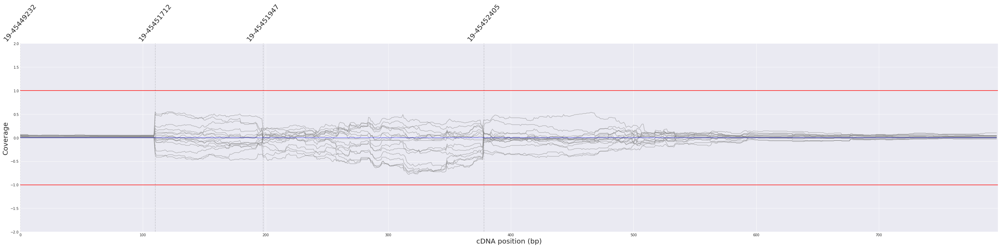

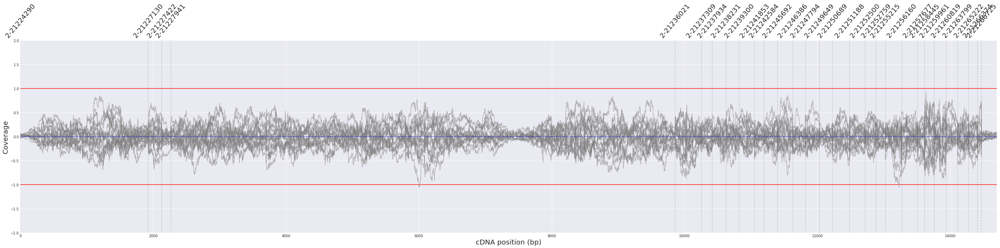

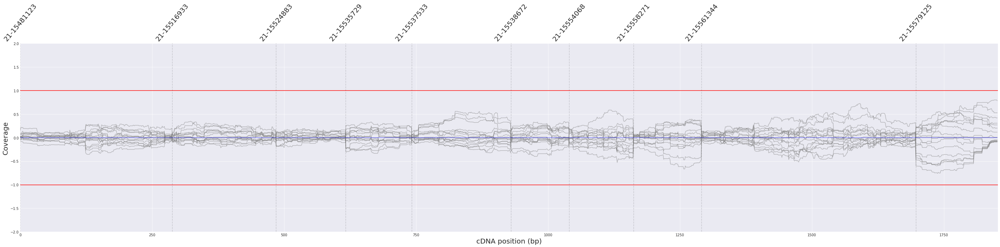

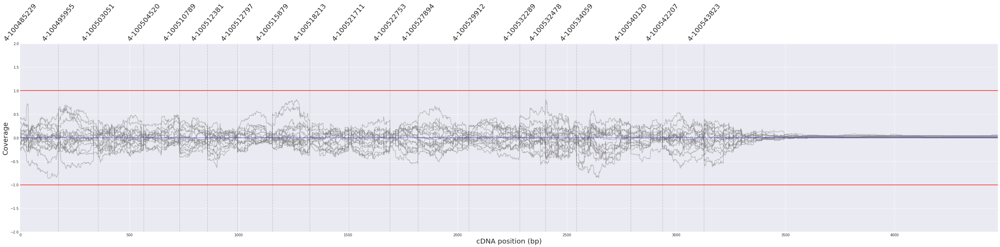

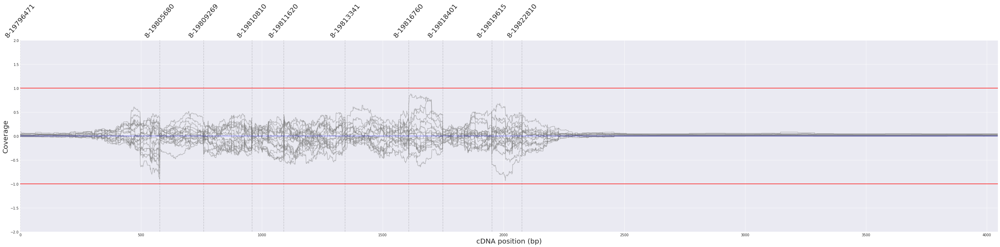

In [163]:
# Create a dataframe per gene
for gene in list(ab.gene.unique()):
    dfg = cd.loc[cd['gene'].map(str) == gene].reset_index(drop=True)
    dfg["index"] = dfg.index

    # Create a plot per gene
    fig = plt.figure(figsize=(40,10))
    ax1 = fig.add_subplot(111)
    for i in range(5, len(header)):
        ax1.plot(dfg['index'], dfg[header[i]], alpha=0.5, color='gray')
    ax1.plot(dfg['index'], dfg['mean'], alpha=0.5, color='blue')
    # Plot limits
    ax1.set_ylim(-2, 2)
    ax1.set_xlim(0, dfg['index'].max() + 1)
    ax1.hlines(y=1, xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[-1], color='r')
    ax1.hlines(y=-1, xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[-1], color='r')

    # Getting positions to plot vertical lines separating exons
    index_positions = []
    names = []
    for exon in list(dfg.feature.unique()):
        index_positions.append(dfg[dfg['feature']==exon].iloc[0]["index"])
        names.append(str(dfg[dfg['feature']==exon].iloc[0]["chr"]) + "-" + 
                     str(dfg[dfg['feature']==exon].iloc[0]["start"]))

    # Set limits for the vertical lines, it is a plot on top of a plot
    ax2 = ax1.twiny()
    ax2.set_ylim(ax1.get_ylim())
    ax2.set_xlim(ax1.get_xlim())

    # Paint vertical lines, we use [1:] because the first point is always zero
    ax2.vlines(x=index_positions, ymin=-2, ymax=ax2.get_ylim()[1], linestyle='--', 
               alpha=0.15)
    ax2.grid(b=False)
    ax2.set_xticks(index_positions)
    ax2.set_xticklabels(names, rotation=50, minor=False, fontsize=20)

    ax1.set_xlabel('cDNA position (bp)', fontsize=20)
    ax1.set_ylabel('Coverage', fontsize=20)

    fig.tight_layout()
    #figname = "{}_pbcov.png".format(gene)
    #fig.savefig(os.path.join("/home/ugdg/workspace/coverage_HGUV/", figname))
    plt.show()
    plt.close(fig)

In [ ]:
## ANOTHER